### Name - Nyan Hein
### Student Id - 2340911
### Content - CA1 Part A(Image Classification Using CNN)

# Background Research

**By observing the given dataset, the dataset is split into three folders(train, test and validation) and in each folder, there are sub-folders which names generally represent the class of the furits and contains the respective images in the folder.**

# Exploratory Data Analysis(EDA) on the given data

## 1. Inspecting The Sample Images 

In [1]:
## importing necesarry libraies to load the data and to inspect the images 
import os
import random
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2


In [2]:
## defining a function to load 10 random sample images for each dataset(test, train,validation)
def load_sample_images(dataset_dir, num_samples=10):
    ## getting the classes name
    classes = os.listdir(dataset_dir)
    ### defining a dictionary for random images for each class
    sample_images = {}
    for class_name in classes:
        ### getting the full directory path for each class
        class_dir = os.path.join(dataset_dir, class_name)
        images = os.listdir(class_dir)
        ### getting random images from each class
        sample_images[class_name] = random.sample(images, min(num_samples, len(images)))
    return sample_images



In [3]:
## defining a function to show the images for each class
def plot_sample_images(sample_images, dataset_dir):
    num_classes = len(sample_images)
    ## defining figure size with the width 15 and height relative to the number of classes 
    fig = plt.figure(figsize=(15, num_classes * 1.5))
    ## defing the grid for 10 rows and columns = number of classes 
    gs = gridspec.GridSpec(num_classes, 10, wspace=0.1, hspace=0.1)
    ## looping the classes 
    for i, (class_name, images) in enumerate(sample_images.items()):
        ## looping the images in each class
        for j, image_name in enumerate(images):
            ## getting each image file path 
            image_path = os.path.join(dataset_dir, class_name, image_name)
            ## reading image in BGR format 
            image = cv2.imread(image_path)
            ## converting image from BGR to RGB 
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
            ax = plt.subplot(gs[i, j])
            ax.imshow(image)
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_aspect('auto')
            ## setting the label for each class
            if j == 0:
                ax.set_ylabel(class_name, fontsize=10)
    
    plt.show()

In [209]:
train_dataset_dir_without_augmentation = "./Orignial Data/train"

### Viewing images from Train dataset

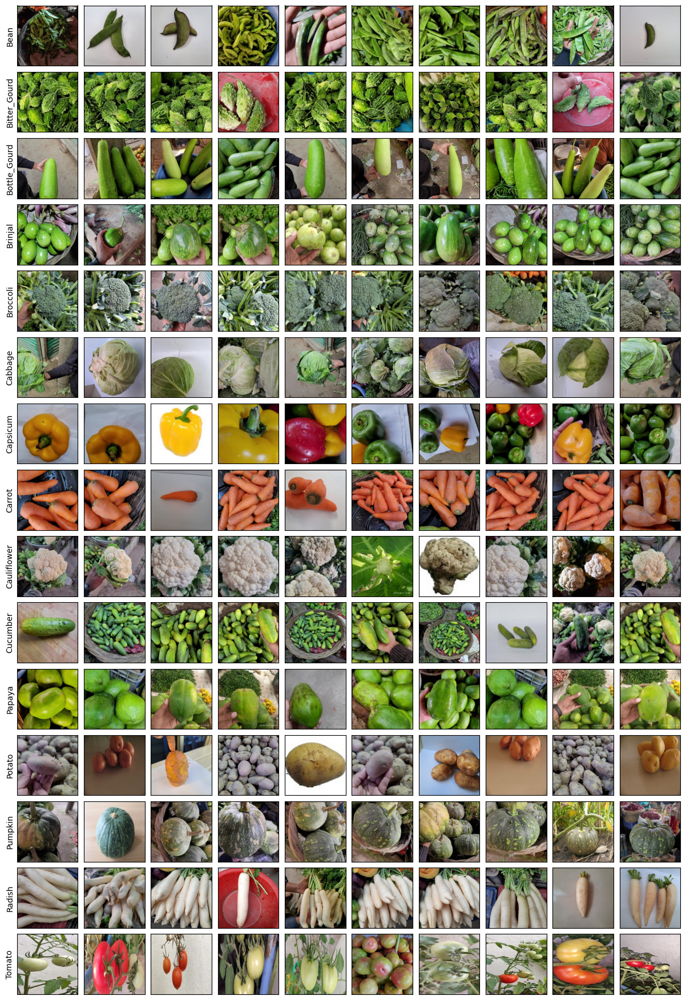

In [128]:
# Path to the dataset directory
train_dataset_dir = "./Dataset for CA1 part A - AY2425S1/train"
# loading images from train data set 
train_sample_images = load_sample_images(train_dataset_dir, num_samples=10)
plot_sample_images(train_sample_images, train_dataset_dir)

**From the observations in the folders of the images, in the bean class, there are images of carrots which is the missclassification. Those carrot images from the bean folder will be moved to the carrot folder. Another observation is that in the tomato class, the images are distorted or enlongated. In all classes, some images show only one fruit while other images show various number of the fruit of a particular,  so this dataset seems to represent real life scenarios and this kind of dataset seems to help build the model which may be able to classify the fruits in those diverse contexts.**

## Viewing images from Test dataset

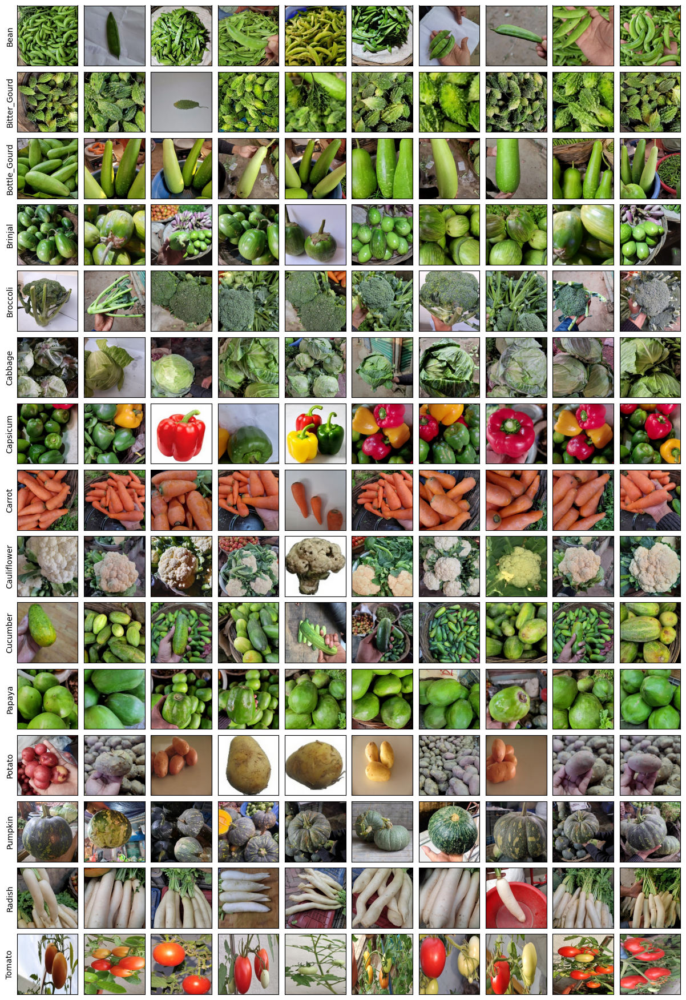

In [5]:
test_dataset_dir = "./Dataset for CA1 part A - AY2425S1/test"
# loading images from test data set 
test_sample_images = load_sample_images(test_dataset_dir, num_samples=10)
plot_sample_images(test_sample_images, test_dataset_dir)

## Viewing images from Validation dataset

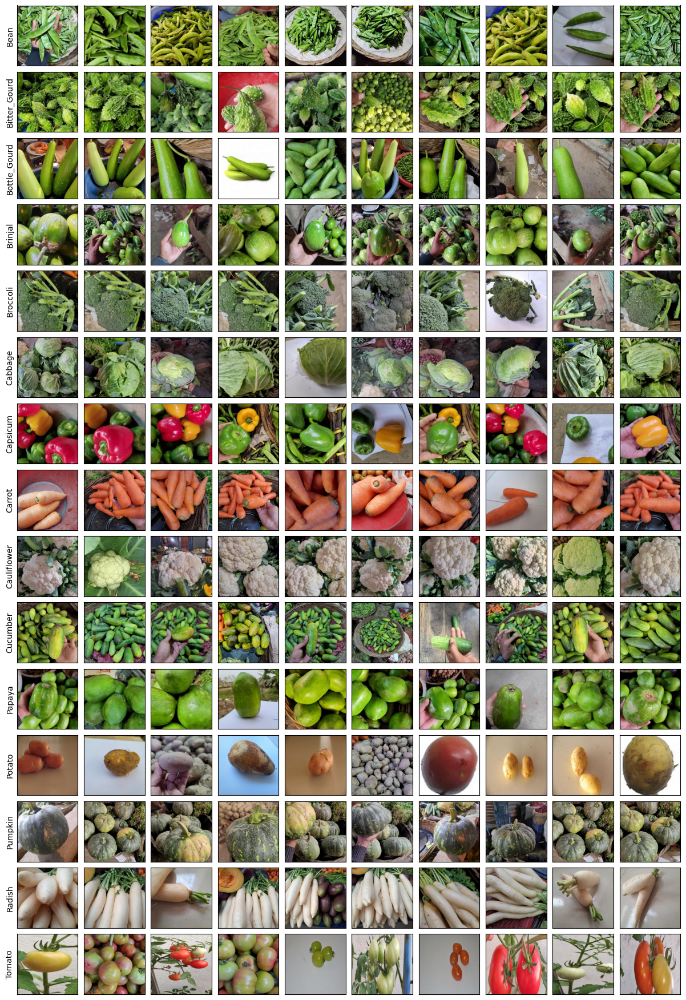

In [6]:
validation_dataset_dir = "./Dataset for CA1 part A - AY2425S1/validation"
# loading images from test data set 
validation_sample_images = load_sample_images(validation_dataset_dir, num_samples=10)
plot_sample_images(validation_sample_images, validation_dataset_dir)

**Also for the test and validation dataset, the tomato images are distorted or enolongated. And test and validation dataset also have the correct type of images in each class(in the correct folder) like the train data set** 

## Analysing the class distributions of the classes(fruits) in three datasets(train,test,validation)

In [9]:
## writing a function of getting the number of class distribution 
def get_class_distribution(dataset_dir):
    class_distribution = {}
    for class_name in os.listdir(dataset_dir):
        class_dir = os.path.join(dataset_dir, class_name)
        num_images = len(os.listdir(class_dir))
        class_distribution[class_name] = num_images
    return class_distribution

In [10]:
## getting the distribution 
train_distribution = get_class_distribution(train_dataset_dir)
test_distribution = get_class_distribution(test_dataset_dir)
validation_distribution = get_class_distribution(validation_dataset_dir)

In [11]:
### checking the number of classes in each dataset 
print(f'Number of classes in train data set: {len(train_distribution)}')
print(f'Number of classes in test data set: {len(test_distribution)}')
print(f'Number of classes in validation data set: {len(validation_distribution)}')

Number of classes in train data set: 15
Number of classes in test data set: 15
Number of classes in validation data set: 15


In [17]:
print(train_distribution)

{'Bean': 784, 'Bitter_Gourd': 720, 'Bottle_Gourd': 433, 'Brinjal': 868, 'Broccoli': 750, 'Cabbage': 503, 'Capsicum': 351, 'Carrot': 256, 'Cauliflower': 587, 'Cucumber': 812, 'Papaya': 566, 'Potato': 377, 'Pumpkin': 814, 'Radish': 248, 'Tomato': 955}


In [149]:
import numpy as np
classes = list(train_distribution.keys())
num_classes = len(classes)
bar_width = 0.3
index = np.arange(num_classes)

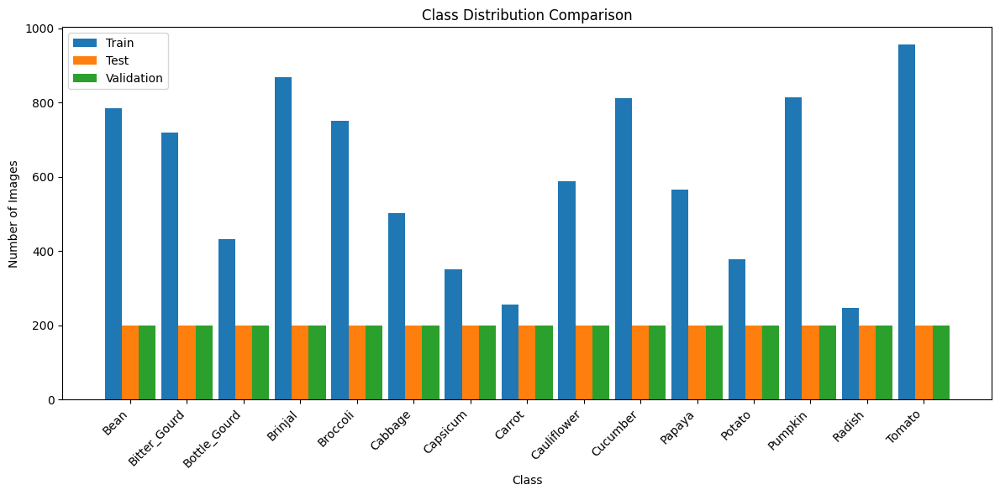

In [18]:
## plotting to compare the distribution of classes in each dataset(train,test,validation)

## plotting bargrahs for different classes
plt.figure(figsize=(12, 6))
plt.bar(index, list(train_distribution.values()), bar_width, label='Train')
plt.bar(index + bar_width, list(test_distribution.values()), bar_width, label='Test')
plt.bar(index + 2*bar_width, list(validation_distribution.values()), bar_width, label='Validation')

plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Class Distribution Comparison')
plt.xticks(index + bar_width, classes, rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


**From the analysis of the above graph, the test and validation data sets have the equal number of images in different classes but in the train data set, the classdistribution is imbalanced, especially for the the following classes,   
* bottle_gourd
* cabbage
* carrot
* potato and
* radish.

So, when building the model, the model will be biased towards the classes with more data because the model will learn better about the classes with more data than the underrepresented classes. So Later, the followings may be performed  
* Resampling Techniques or
* Data Augmentation to balanace the imblanaced data set **

### Analysising the dimension of images

In [16]:
from PIL import Image


# Dictionary to hold image dimensions
train_image_dimensions = {}

## finding the dimension of each images
for folder in os.listdir(train_dataset_dir):
    folder_path = os.path.join(train_dataset_dir, folder)
    if os.path.isdir(folder_path):
        # List to hold dimensions of images in this folder
        train_image_dimensions[folder] = []
        for file in os.listdir(folder_path):
            file_path = os.path.join(folder_path, file)
            with Image.open(file_path) as img:
                train_image_dimensions[folder].append(img.size)
## testing the values 
for fruit, dims in train_image_dimensions.items():
    #printing the dimensions of first 5 images for each class
    print(f"{fruit} dimensions: {dims[:5]}")  

Bean dimensions: [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]
Bitter_Gourd dimensions: [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]
Bottle_Gourd dimensions: [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]
Brinjal dimensions: [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]
Broccoli dimensions: [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]
Cabbage dimensions: [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]
Capsicum dimensions: [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]
Carrot dimensions: [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]
Cauliflower dimensions: [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]
Cucumber dimensions: [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]
Papaya dimensions: [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]
Potato dimensions: [(224, 224), (224, 224), (224, 224), (224, 224), (224, 224)]
Pumpkin dimension

### Visualizing the dimesion of the images 

In [17]:
import seaborn as sns
import pandas as pd

## creating a data frame for dimension of images to visualize the dimesion of the data
data_train_dimension = []
for fruit, dims in train_image_dimensions.items():
    for dim in dims:
        data_train_dimension.append((fruit, dim[0], dim[1]))

# Create a DataFrame
df_train_dimension = pd.DataFrame(data_train_dimension, columns=['Class', 'Width', 'Height']) 

In [18]:
df_train_dimension

,Class,Width,Height
0,Bean,224,224
1,Bean,224,224
2,Bean,224,224
3,Bean,224,224
4,Bean,224,224
...,...,...,...
11779,Tomato,224,224
11780,Tomato,224,224
11781,Tomato,224,224
11782,Tomato,224,224


Text(0.5, 1.0, 'Distribution of Image Heights')

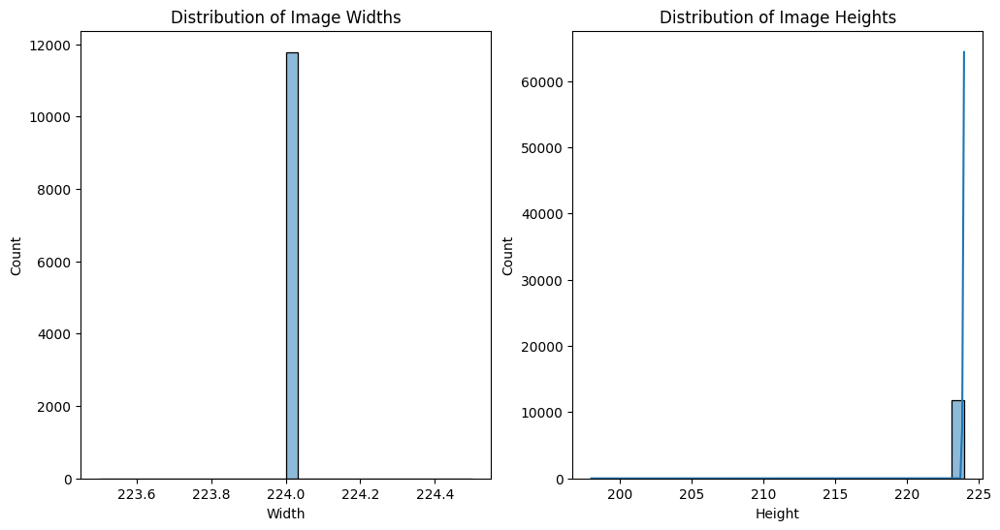

In [19]:
plt.figure(figsize=(12, 6))

# Histogram for widths
plt.subplot(1, 2, 1)
sns.histplot(df_train_dimension, x='Width', bins=30, kde=True)
plt.title('Distribution of Image Widths')

# Histogram fo heights
plt.subplot(1, 2, 2)
sns.histplot(df_train_dimension, x='Height', bins=30, kde=True)
plt.title('Distribution of Image Heights')

In [16]:
rows_not_224 = df_train_dimension[df_train_dimension['Height'] != 224]

# Display the filtered DataFrame
print(rows_not_224)

             Class  Width  Height
1095  Bitter_Gourd    224     205
1178  Bitter_Gourd    224     200
6181        Papaya    224     198
6501        Papaya    224     210


**From the analysis above, although all the images from train data set have the same width(224) but very few images have different height from the given height(224). But, later the image sizes will be standardized into two different sizes(37x37) and (131x131)**

Since the images has to be converted to the gray scale for this assignment, the pixel intensity distribution of images will be performed on gray scale.  

## Manual Actions Performed Based on the manual inspection of the given dataset(Train dataset)

  1. 11 carrot images are deleted from the Bean folder in the train data set.
  2. 8 bottle gourd images are deleted from the Bottle Gourd folder because in those photos, the bottle gourds is mixed with other fruits(potatoes and tomatoes).
  3. 32 images of Brinjal are deleted from the Brinjal folder because in those photos, tomatoes are mixed with the Brinjal.
  4. 17 images of Broccoli are deleted from the Broccoli folder because carrots are mixed with broccoli.
  5. 28 images of Cauliflower are deleted from the Cauliflower directory because tomatoes are mixed.
  6. 41 images of cucumber are deleted from the Cucumber folder because they are mixed with other vegetables(tomatoes, cauliflower)
  7. 31 images of Papapya are deleted from the papaya folder because they are mixed with tomatoes.
  8. 4 images of pumpkin are deleted from the pumpkin folder because they are mixed with potatoes.


## Model Test Training before performing Data Augmentation

### Training A Model By Resizing the images to the gray scale and 37x37 size and producing the directory

**At first, train a model to test how well a basic CNN model will classify the images without any data augmentation or feature engineering**

**Setting up image generator to resize, normalize and to change the gray scale**

In [14]:
from keras.preprocessing.image import ImageDataGenerator

In [85]:


# Set up ImageDataGenerators for train, test, and validation
## train data generator
train_datagen = ImageDataGenerator(
    rescale=1./255
)


In [81]:
## test data generator
test_val_datagen = ImageDataGenerator(
    rescale=1./255
)

In [210]:
# Creating generators
train_generator = train_datagen.flow_from_directory(
    train_dataset_dir_without_augmentation,
    batch_size=20,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(37,37)
)

Found 9032 images belonging to 15 classes.


In [211]:
test_generator = test_val_datagen.flow_from_directory(
    test_dataset_dir,
    batch_size=20,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(37,37),
    shuffle=False
)

Found 3000 images belonging to 15 classes.


In [212]:
validation_generator = test_val_datagen.flow_from_directory(
    validation_dataset_dir,
    batch_size=20,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(37,37)
)

Found 3000 images belonging to 15 classes.


### Visualing the gray scaled and resized image

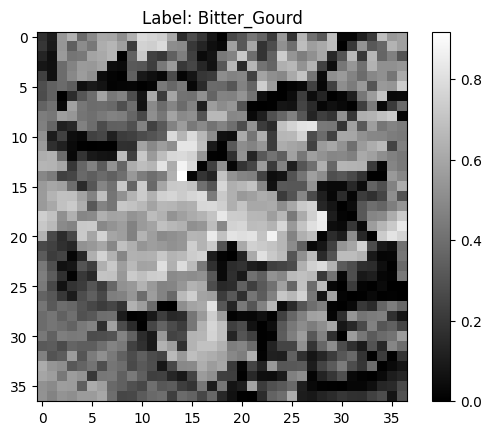

In [36]:
images, labels = next(train_generator)
## getiing the class indices (to get the string value of the class(fruit))
class_indices = train_generator.class_indices

# Invert the dictionary to change indices to class names
index_to_class = {v: k for k, v in class_indices.items()}
plt.imshow(images[0].reshape(37,37), cmap='gray')  
plt.title(f"Label: {index_to_class[labels[0].argmax()]}")     
plt.colorbar()
plt.show()

### Building the basic model how the model will react

In [213]:
## importing libraries


from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense 
from tensorflow.keras.layers import Dropout 
from tensorflow.keras.layers import Flatten 
from tensorflow.keras.layers import Conv2D 
from tensorflow.keras.layers import MaxPooling2D 
from tensorflow.keras.utils import to_categorical 

**Modelling for 37x37 images**

In [214]:
# build the model 
# create model 
basic_model_37x37 = Sequential() 
basic_model_37x37.add(Conv2D(30, (5, 5), input_shape=(37, 37, 1), activation='relu')) 
basic_model_37x37.add(MaxPooling2D(pool_size=(2, 2))) 
basic_model_37x37.add(Conv2D(15, (3, 3), activation='relu')) 
basic_model_37x37.add(MaxPooling2D(pool_size=(2, 2))) 
basic_model_37x37.add(Dropout(0.2)) 
basic_model_37x37.add(Flatten()) 
basic_model_37x37.add(Dense(128, activation='relu')) 
basic_model_37x37.add(Dense(50, activation='relu')) 
basic_model_37x37.add(Dense(num_classes, activation='softmax')) 
# Compiling the model 
basic_model_37x37.compile(loss='categorical_crossentropy',  
              optimizer='adam', metrics=['accuracy']) 

**Model Visualization**

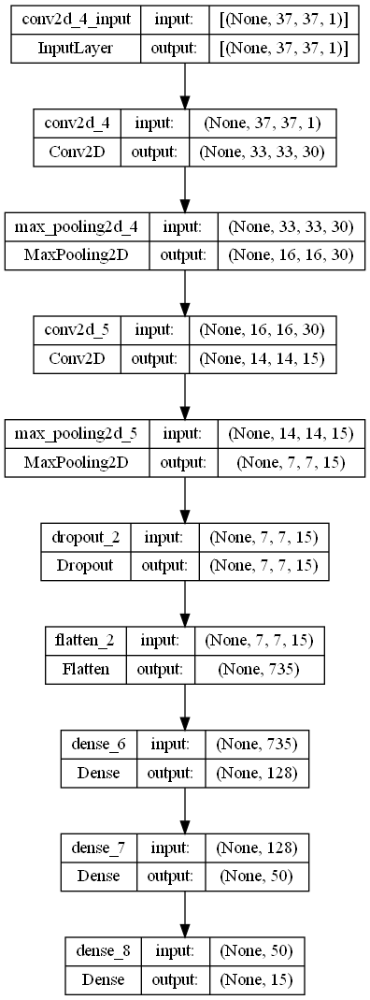

In [44]:
from keras.utils.vis_utils import plot_model
plot_model(basic_model_37x37, to_file='model_visualization.png', show_shapes=True, show_layer_names=True)

In [215]:
## training the model 
basic_model_37x37_history = basic_model_37x37.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=100,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    verbose = 1
   
)

Epoch 1/100
Epoch 2/100
Epoch 3/100
Epoch 4/100
Epoch 5/100
Epoch 6/100
Epoch 7/100
Epoch 8/100
Epoch 9/100
Epoch 10/100
Epoch 11/100
Epoch 12/100
Epoch 13/100
Epoch 14/100
Epoch 15/100
Epoch 16/100
Epoch 17/100
Epoch 18/100
Epoch 19/100
Epoch 20/100
Epoch 21/100
Epoch 22/100
Epoch 23/100
Epoch 24/100
Epoch 25/100
Epoch 26/100
Epoch 27/100
Epoch 28/100
Epoch 29/100
Epoch 30/100
Epoch 31/100
Epoch 32/100
Epoch 33/100
Epoch 34/100
Epoch 35/100
Epoch 36/100
Epoch 37/100
Epoch 38/100
Epoch 39/100
Epoch 40/100
Epoch 41/100
Epoch 42/100
Epoch 43/100
Epoch 44/100
Epoch 45/100
Epoch 46/100
Epoch 47/100
Epoch 48/100
Epoch 49/100
Epoch 50/100
Epoch 51/100
Epoch 52/100
Epoch 53/100
Epoch 54/100
Epoch 55/100
Epoch 56/100
Epoch 57/100
Epoch 58/100
Epoch 59/100
Epoch 60/100
Epoch 61/100
Epoch 62/100
Epoch 63/100
Epoch 64/100
Epoch 65/100
Epoch 66/100
Epoch 67/100
Epoch 68/100
Epoch 69/100
Epoch 70/100
Epoch 71/100
Epoch 72/100
Epoch 73/100
Epoch 74/100
Epoch 75/100
Epoch 76/100
Epoch 77/100
Epoch 78

### Finding the best epoch and analyzing the overfitting of the model

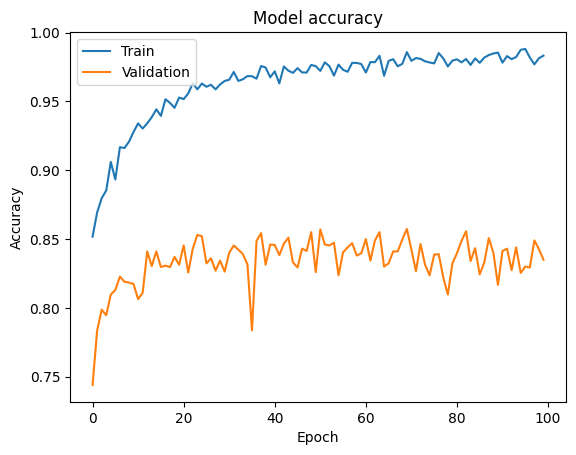

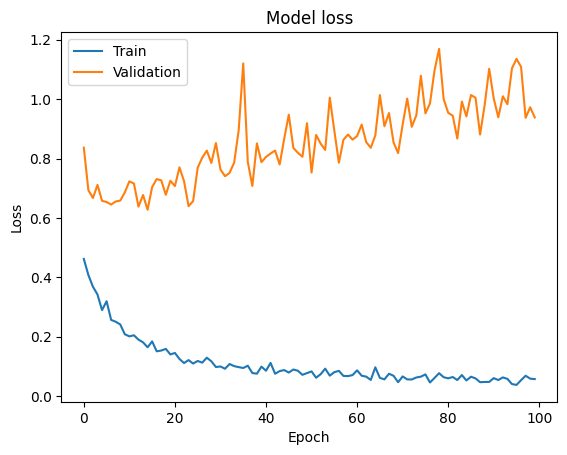

In [49]:
plt.plot(basic_model_37x37_history.history['accuracy'])
plt.plot(basic_model_37x37_history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'],loc='upper left')
plt.show()

plt.plot(basic_model_37x37_history.history['loss'])
plt.plot(basic_model_37x37_history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'],loc='upper left')
plt.show()

**From the above plot, the model is fitting well on the training data, in terms of both loss(less than 0.1) and accuracy(over 0.95). But there is overfitting. In the loss graph, although the loss of train data set decreases gradually, but the loss of the validation data does not decrease and increase gradually. In accuracy graph, although the accuracy of the train increases, the accuracy of validation data does not increase over the epochs** 

### Producing the confusion matrix for this model

In [218]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
from math import ceil

In [219]:
## definging function to produce a confusion matrix and classification metrics
def evaluate_model(model, test_generator, class_names):
    
    test_generator.reset()
    
    # Calculating the number of steps
    steps = ceil(test_generator.samples / test_generator.batch_size)
    
    # Getting the predictions
    Y_pred = model.predict(test_generator, steps=steps, verbose=1)
    y_pred = np.argmax(Y_pred, axis=1)
    
    # Getting true labels
    y_true = test_generator.classes
    
    # Calculating metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average=None)
    recall = recall_score(y_true, y_pred, average=None)
    f1 = f1_score(y_true, y_pred, average=None)
    
    
    # Print classification report
    print('Classification Report:')
    print(classification_report(y_true, y_pred, target_names=class_names))
    
    # Creating confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    
    # Plotting the confusion matrix
    plt.figure(figsize=(14, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()

150/150 [==============================] - 3s 19ms/step
Classification Report:
              precision    recall  f1-score   support

        Bean       0.88      0.82      0.85       200
Bitter_Gourd       0.89      0.82      0.86       200
Bottle_Gourd       0.94      0.94      0.94       200
     Brinjal       0.73      0.92      0.82       200
    Broccoli       0.92      0.72      0.81       200
     Cabbage       0.84      0.71      0.77       200
    Capsicum       0.86      0.88      0.87       200
      Carrot       0.94      0.80      0.86       200
 Cauliflower       0.76      0.86      0.81       200
    Cucumber       0.83      0.94      0.88       200
      Papaya       0.87      0.89      0.88       200
      Potato       0.86      0.79      0.82       200
     Pumpkin       0.87      0.80      0.84       200
      Radish       0.81      0.81      0.81       200
      Tomato       0.63      0.81      0.71       200

    accuracy                           0.83      3000
 

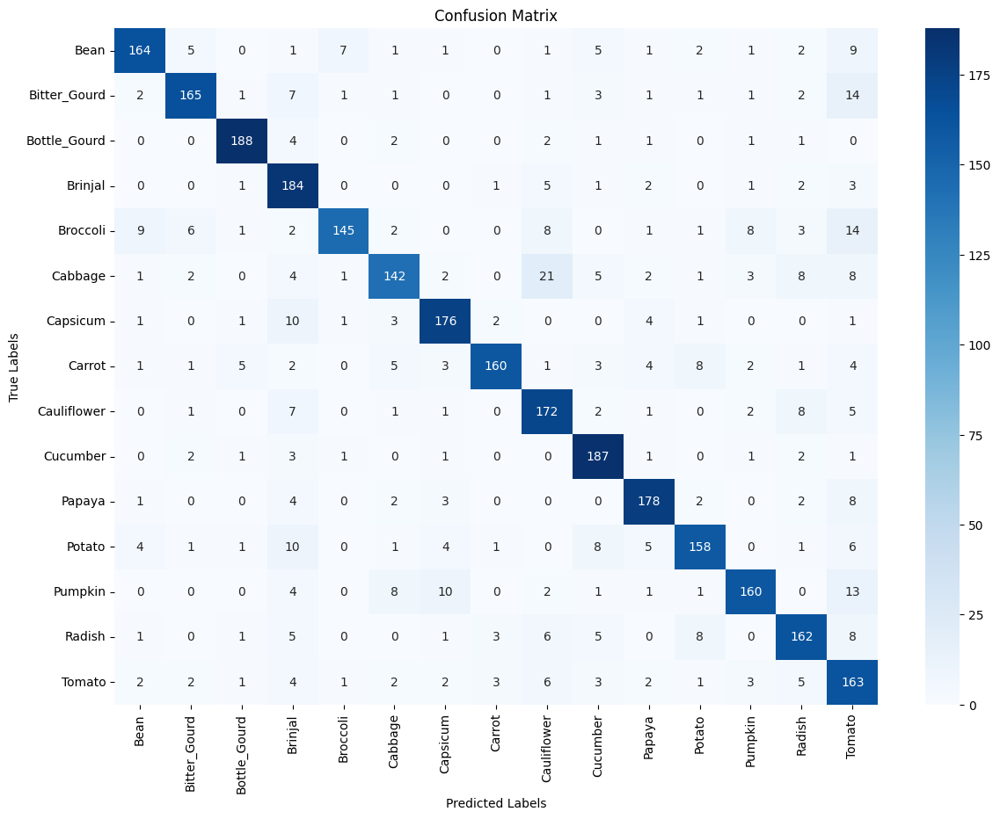

In [220]:
evaluate_model(basic_model_37x37,test_generator,class_names)

**From the confusion matrix, the model cannot predict well for the radish class with only 3 correct predictions and there are also serveral issues with the model. For example, the model usually predicts papaya as bitte gourd(24 wrong predictions), tomato as potato(21 predictions),etc..**

**Testing the model accuracy on test data**


In [52]:
test_loss, test_acc = basic_model_37x37.evaluate(test_generator)
print(f"Test accuracy: {test_acc}, Test loss: {test_loss}")

150/150 [==============================] - 11s 77ms/step - loss: 0.8481 - accuracy: 0.8527
Test accuracy: 0.8526666760444641, Test loss: 0.8480936884880066


**The model accuracy on the test data is 0.85 which is not bad, but the model still need to be improved to increase the accuracy.**

## Performing Data Augmentation

**As a way to solve the overfitting and to solve the class imbalance, data augmentation will be performed on the train data set.(rotation and flipping  will be performed). Since the classes are imbalanced the model may be biased. So, by adding new data using data augmentation, this could solve both the problem of class imablance and overfitting(because the model will be able to learn more different data)**

In [19]:
print(train_distribution)

{'Bean': 784, 'Bitter_Gourd': 720, 'Bottle_Gourd': 433, 'Brinjal': 868, 'Broccoli': 750, 'Cabbage': 503, 'Capsicum': 351, 'Carrot': 256, 'Cauliflower': 587, 'Cucumber': 812, 'Papaya': 566, 'Potato': 377, 'Pumpkin': 814, 'Radish': 248, 'Tomato': 955}


From the above numbers, bottle gourd,cabbages, capsicum and carrot and cauliflowe, papaya, potato and radish have very less number of images compared to other fruits. Data Augmentation will be performed on those classes. 

**Defining a function to perform data augmentation**

**Fliping and/or rotation will be performed on fruit images because that will allow the model to learn from different angles and the images will also not be distorted**

In [22]:
import Augmentor
import os
import random
import shutil

In [92]:
# defining a function to create an data augmentation 
def augment_images(class_dir, num_samples):
    # Creating a temp directory to store a subset of original images
    temp_dir = os.path.join(class_dir, 'temp')
    os.makedirs(temp_dir, exist_ok=True)

    # Listing all images in the class directory
    all_images = [f for f in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, f))]

    # Randomly selecting a subset of images to augment
    selected_images = random.sample(all_images, num_samples)
    for img in selected_images:
        shutil.copy(os.path.join(class_dir, img), os.path.join(temp_dir, img))

    # Creating a pipeline for the current class using the temporary directory
    p = Augmentor.Pipeline(temp_dir)

    # Defining the augmentation operations
    p.rotate(probability=0.5, max_left_rotation=25, max_right_rotation=25)
    p.flip_left_right(probability=0.5)

    # Generating the specified number of samples
    p.sample(num_samples)

    # Moving augmented images back to the orignial class folder
    for index, img in enumerate(os.listdir(temp_dir), start=600):
        src = os.path.join(temp_dir, img)
        # Generate a unique filename using the loop index
        dst = os.path.join(class_dir, f'{index}.jpg')
        shutil.move(src, dst)
    shutil.rmtree(temp_dir)



**Data Augmentation for bottle gourd images**

In [33]:
Bottle_Gourd_folder = './Dataset for CA1 part A - AY2425S1/train/Bottle_Gourd'
## adding more 300 images
num_samples =  300

# Perform augmentation
augment_images(Bottle_Gourd_folder, num_samples)

Initialised with 300 image(s) found.
Output directory set to ./Dataset for CA1 part A - AY2425S1/train/Bottle_Gourd\temp\output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=224x224 at 0x22A95DC0100>: 100%|█| 300/300 [00:00<00:


In [39]:
train_distribution = get_class_distribution(train_dataset_dir)
print(f"Number of Bottle Gourd images after data augmentation: {train_distribution['Bottle_Gourd']}")

Number of Bottle Gourd images after data augmentation: 733


**Data Augmentation for Capsicum images**

In [41]:
print(f"Before data augmentation, Number of Capsicum: {train_distribution['Capsicum']}")

Before data augmentation, Number of Capsicum: 351


In [44]:
Capsicum_folder = './Dataset for CA1 part A - AY2425S1/train/Capsicum'
num_samples =  351

# Performing augmentation
augment_images(Capsicum_folder, num_samples)

Initialised with 351 image(s) found.
Output directory set to ./Dataset for CA1 part A - AY2425S1/train/Capsicum\temp\output.

Processing <PIL.Image.Image image mode=RGB size=224x224 at 0x22A960A38E0>: 100%|█| 351/351 [00:00<00:00, 390.78 Samples


In [46]:
train_distribution = get_class_distribution(train_dataset_dir)
print(f"Number of Capsicum images after data augmentation: {train_distribution['Capsicum']}")

Number of Capsicum images after data augmentation: 703


**Data Augmentation for cabbages images**

In [49]:
print(f"Before data augmentation, Number of Cabbage: {train_distribution['Cabbage']}")

Before data augmentation, Number of Cabbage: 503


In [50]:
Cabbage_folder = './Dataset for CA1 part A - AY2425S1/train/Cabbage'
num_samples =  351

# Performing augmentation
augment_images(Cabbage_folder, num_samples)

Initialised with 351 image(s) found.
Output directory set to ./Dataset for CA1 part A - AY2425S1/train/Cabbage\temp\output.

Processing <PIL.Image.Image image mode=RGB size=224x224 at 0x22A9603DB50>: 100%|█| 351/351 [00:00<00:00, 352.67 Samples


**Data Augmentation for carrot images**

In [53]:
Carrot_folder = './Dataset for CA1 part A - AY2425S1/train/Carrot'
num_samples =  256

# Performing augmentation
augment_images(Carrot_folder, num_samples)

Initialised with 256 image(s) found.
Output directory set to ./Dataset for CA1 part A - AY2425S1/train/Carrot\temp\output.

Processing <PIL.Image.Image image mode=RGB size=224x224 at 0x22A96074910>: 100%|█| 256/256 [00:00<00:00, 329.66 Samples


In [55]:
## adding 200 more images
augment_images(Carrot_folder, 200)

Initialised with 200 image(s) found.
Output directory set to ./Dataset for CA1 part A - AY2425S1/train/Carrot\temp\output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=224x224 at 0x22A9601ADF0>: 100%|█| 200/200 [00:00<00:


In [60]:
train_distribution = get_class_distribution(train_dataset_dir)
print(f"Number of Carrot images after data augmentation: {train_distribution['Carrot']}")

Number of Carrot images after data augmentation: 769


**Data Augmentation for Cauliflower images**

In [56]:
train_distribution = get_class_distribution(train_dataset_dir)
print(f"Number of Capsicum images before data augmentation: {train_distribution['Cauliflower']}")

Number of Capsicum images before data augmentation: 562


In [61]:
Cauliflower_folder = './Dataset for CA1 part A - AY2425S1/train/Cauliflower'
num_samples =  256

# Performing augmentation
augment_images(Cauliflower_folder, num_samples)

Initialised with 256 image(s) found.
Output directory set to ./Dataset for CA1 part A - AY2425S1/train/Cauliflower\temp\output.

Processing <PIL.Image.Image image mode=RGB size=224x224 at 0x22A9601F520>: 100%|█| 256/256 [00:00<00:00, 404.47 Samples


In [62]:
train_distribution = get_class_distribution(train_dataset_dir)
print(f"Number of Capsicum images after data augmentation: {train_distribution['Cauliflower']}")

Number of Capsicum images after data augmentation: 819


**Data Augmentation for Papaya images**

In [78]:
Papaya_folder = './Dataset for CA1 part A - AY2425S1/train/Papaya'

print(f"Number of Papaya images before data augmentation: {train_distribution['Papaya']}")

Number of Papaya images before data augmentation: 536


In [79]:
num_samples =  256

# Performing augmentation
augment_images(Papaya_folder, num_samples)

Initialised with 256 image(s) found.
Output directory set to ./Dataset for CA1 part A - AY2425S1/train/Papaya\temp\output.

Processing <PIL.Image.Image image mode=RGB size=224x224 at 0x22A95D6B8E0>: 100%|█| 256/256 [00:00<00:00, 393.21 Samples


In [66]:
print(Papaya_folder)

./Dataset for CA1 part A - AY2425S1/train/Papaya


In [84]:
train_distribution = get_class_distribution(train_dataset_dir)
print(f"Number of Papaya images after data augmentation: {train_distribution['Papaya']}")

Number of Papaya images after data augmentation: 850


**Data Augmentation for Potato images**

In [87]:
Potato_folder = './Dataset for CA1 part A - AY2425S1/train/Potato'
print(f"Number of Potato images before data augmentation: {train_distribution['Potato']}")

Number of Potato images before data augmentation: 377


In [88]:
num_samples =  377

# Performing augmentation
augment_images(Potato_folder, num_samples)

Initialised with 377 image(s) found.
Output directory set to ./Dataset for CA1 part A - AY2425S1/train/Potato\temp\output.

Processing <PIL.Image.Image image mode=RGB size=224x224 at 0x22A96AE5250>: 100%|█| 377/377 [00:00<00:00, 380.75 Samples


In [89]:
train_distribution = get_class_distribution(train_dataset_dir)
print(f"Number of Potato images after data augmentation: {train_distribution['Potato']}")

Number of Potato images after data augmentation: 755


**Data Augmentation for Radish images**

In [90]:
Radish_folder = './Dataset for CA1 part A - AY2425S1/train/Radish'
print(f"Number of Radishj images before data augmentation: {train_distribution['Radish']}")

Number of Radishj images before data augmentation: 248


In [91]:
num_samples =  248

# Performing augmentation
augment_images(Radish_folder, num_samples)

Initialised with 248 image(s) found.
Output directory set to ./Dataset for CA1 part A - AY2425S1/train/Radish\temp\output.

Processing <PIL.Image.Image image mode=RGB size=224x224 at 0x22AFFDACE80>: 100%|█| 248/248 [00:00<00:00, 383.89 Samples


In [93]:
## adding 200 more images to radish class
augment_images(Radish_folder, 200)

Initialised with 200 image(s) found.
Output directory set to ./Dataset for CA1 part A - AY2425S1/train/Radish\temp\output.

Processing <PIL.Image.Image image mode=RGB size=224x224 at 0x22AE87B0310>: 100%|█| 200/200 [00:00<00:00, 362.68 Samples


In [95]:
train_distribution = get_class_distribution(train_dataset_dir)
print(f"Number of Radishj images after data augmentation: {train_distribution['Radish']}")

Number of Radishj images after data augmentation: 698


In [96]:
print(train_distribution)

{'Bean': 784, 'Bitter_Gourd': 720, 'Bottle_Gourd': 733, 'Brinjal': 838, 'Broccoli': 733, 'Cabbage': 854, 'Capsicum': 702, 'Carrot': 768, 'Cauliflower': 819, 'Cucumber': 771, 'Papaya': 850, 'Potato': 755, 'Pumpkin': 810, 'Radish': 698, 'Tomato': 955}


### Training the model again after data augmentation using more data

In [68]:
from keras.preprocessing.image import ImageDataGenerator

In [69]:
train_datagen = ImageDataGenerator(
    rescale=1./255
)

In [155]:
## test data generator
test_val_datagen = ImageDataGenerator(
    rescale=1./255
)

In [217]:
# Creating generators
train_generator = train_datagen.flow_from_directory(
    train_dataset_dir,
    batch_size=20,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(37,37)
)

Found 11784 images belonging to 15 classes.


In [72]:
test_generator = test_val_datagen.flow_from_directory(
    test_dataset_dir,
    batch_size=20,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(37,37)
)

Found 3000 images belonging to 15 classes.


In [73]:
validation_generator = test_val_datagen.flow_from_directory(
    validation_dataset_dir,
    batch_size=20,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(37,37)
)

Found 3000 images belonging to 15 classes.


**Training the model**

In [65]:
## training the model with more data

basic_model_37x37_history = basic_model_37x37.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=100,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    verbose = 1
   
)

Epoch 1/100
589/589 [==============================] - 26s 41ms/step - loss: 2.2930 - accuracy: 0.2412 - val_loss: 1.8858 - val_accuracy: 0.4010
Epoch 2/100
589/589 [==============================] - 14s 24ms/step - loss: 1.6163 - accuracy: 0.4691 - val_loss: 1.4049 - val_accuracy: 0.5530
Epoch 3/100
589/589 [==============================] - 15s 25ms/step - loss: 1.2489 - accuracy: 0.5922 - val_loss: 1.1531 - val_accuracy: 0.6323
Epoch 4/100
589/589 [==============================] - 14s 24ms/step - loss: 1.0060 - accuracy: 0.6772 - val_loss: 1.0358 - val_accuracy: 0.6617
Epoch 5/100
589/589 [==============================] - 14s 24ms/step - loss: 0.8230 - accuracy: 0.7314 - val_loss: 0.8269 - val_accuracy: 0.7437
Epoch 6/100
589/589 [==============================] - 14s 24ms/step - loss: 0.6870 - accuracy: 0.7802 - val_loss: 0.8494 - val_accuracy: 0.7343
Epoch 7/100
589/589 [==============================] - 14s 24ms/step - loss: 0.5852 - accuracy: 0.8126 - val_loss: 0.7278 - val_ac

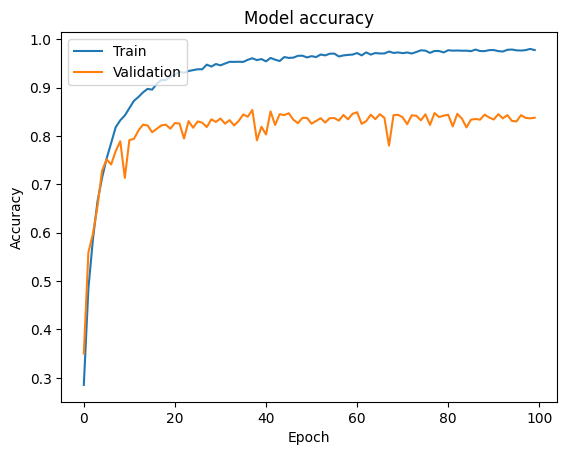

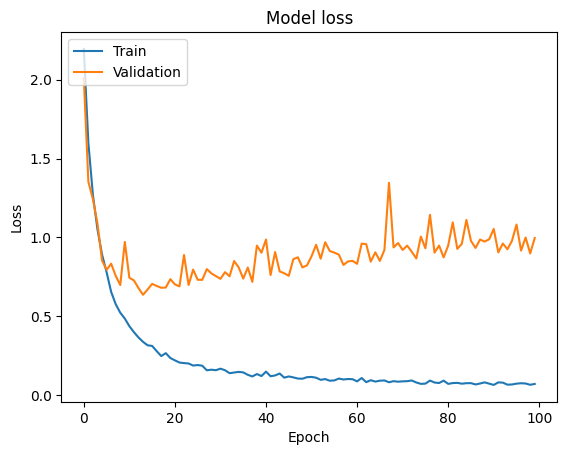

In [108]:
plt.plot(basic_model_37x37_history.history['accuracy'])
plt.plot(basic_model_37x37_history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'],loc='upper left')
plt.show()

plt.plot(basic_model_37x37_history.history['loss'])
plt.plot(basic_model_37x37_history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train','Validation'],loc='upper left')
plt.show()

In [109]:
test_loss, test_acc = basic_model_37x37.evaluate(test_generators)
print(f"Test accuracy: {test_acc}, Test loss: {test_loss}")

150/150 [==============================] - 12s 82ms/step - loss: 1.0063 - accuracy: 0.8363
Test accuracy: 0.8363333344459534, Test loss: 1.0063321590423584


**From the graphs although there is not significant change in loss graph, between before performing data augmentation and after, there is a difference in accuracy graph. The gap between the validation graph and the train graph is large in the accuracy graph but after data augmentation the gap becomes small which means the overfitting is reduceded and occurs stable accuracy. Further model improvements will be performed to improve the model**

### Model Improvements for the 37X37 model

In [30]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, LeakyReLU
from keras.optimizers import Adam


In [67]:
from keras.layers import BatchNormalization

Defing a CNN model to perform hyperparameter tuning but this time,but this time,**BatchNormalization** layers are added to improve the model performance. 

In [99]:
### defining a fucntion to build a model

def building_model(activation='relu'):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(37, 37, 1), activation=activation))
    ## adding batch normalization after each activation
    model.add(BatchNormalization())  
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Conv2D(64, (3, 3), activation=activation))
    model.add(BatchNormalization())  
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Flatten())
    model.add(Dropout(0.3))
    model.add(Dense(128, activation=activation))
    model.add(BatchNormalization())  
    model.add(Dense(50, activation=activation))
    model.add(BatchNormalization()) 
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

At first, find the best **activation function**. 

In [77]:
activation_functions = ['relu','sigmoid', 'tanh']
results = {}

for activation in activation_functions:
    model = building_model(activation)
    print(f"Training with {activation} activation...")
    history = model.fit(train_generator,epochs=20, ## 20 epochs is used because from the above training process the model accuracy has increased significantly around 20 
                        validation_data=validation_generator)
    accuracy = history.history['val_accuracy'][-1]  # Last validation accuracy
    results[activation] = accuracy
    print(f"{activation} - Validation Accuracy: {accuracy}")

# Determinng the best activation function
best_activation = max(results, key=results.get)
print(f"Best Activation Function: {best_activation} with Accuracy: {results[best_activation]}")

Training with relu activation...
Epoch 1/20
590/590 [==============================] - 17s 26ms/step - loss: 1.6042 - accuracy: 0.4979 - val_loss: 1.7605 - val_accuracy: 0.4467
Epoch 2/20
590/590 [==============================] - 15s 26ms/step - loss: 0.8788 - accuracy: 0.7328 - val_loss: 0.8098 - val_accuracy: 0.7560
Epoch 3/20
590/590 [==============================] - 15s 26ms/step - loss: 0.6604 - accuracy: 0.7965 - val_loss: 1.1366 - val_accuracy: 0.6767
Epoch 4/20
590/590 [==============================] - 15s 25ms/step - loss: 0.4213 - accuracy: 0.8712 - val_loss: 0.5782 - val_accuracy: 0.8197
Epoch 5/20
590/590 [==============================] - 15s 25ms/step - loss: 0.3279 - accuracy: 0.8961 - val_loss: 0.6768 - val_accuracy: 0.7990
Epoch 6/20
590/590 [==============================] - 15s 25ms/step - loss: 0.2561 - accuracy: 0.9163 - val_loss: 0.5591 - val_accuracy: 0.8297
Epoch 7/20
590/590 [==============================] - 15s 25ms/step - loss: 0.2064 - accuracy: 0.9328 -

**So, the best activation function is relu and moreover, the model's accuracy has also increaed by 0.027 by adding the batch normalization layers**

### Finding the best batch size and learning rate using Grid Search

In [79]:
batch_sizes = [10, 20, 30]
learning_rates = [0.001, 0.01, 0.1]

best_params = {}
max_accuracy = 0

for batch_size in batch_sizes:
    for lr in learning_rates:
        ## updating the batch size for training generator
        train_generator.batch_size = batch_size 
        validation_generator.batch_size = batch_size
        model = building_model(best_activation)
        model.compile(optimizer=Adam(learning_rate=lr), loss='categorical_crossentropy', metrics=['accuracy'])
        print(f"Training with batch size {batch_size} and learning rate {lr}...")
        history = model.fit(train_generator,
                            epochs=10,  # Reduced epoch for quick training
                            validation_data=validation_generator)
        accuracy = history.history['val_accuracy'][-1]
        print(f"Batch Size: {batch_size}, LR: {lr} - Validation Accuracy: {accuracy}")

        if accuracy > max_accuracy:
            max_accuracy = accuracy
            best_params['batch_size'] = batch_size
            best_params['learning_rate'] = lr
            best_params['accuracy'] = accuracy

print(f"Best Parameters: {best_params}")

Training with batch size 10 and learning rate 0.001...
Epoch 1/10
1179/1179 [==============================] - 18s 14ms/step - loss: 1.7774 - accuracy: 0.4379 - val_loss: 1.4854 - val_accuracy: 0.5347
Epoch 2/10
1179/1179 [==============================] - 17s 14ms/step - loss: 1.1870 - accuracy: 0.6279 - val_loss: 1.4837 - val_accuracy: 0.5470
Epoch 3/10
1179/1179 [==============================] - 17s 14ms/step - loss: 0.9093 - accuracy: 0.7070 - val_loss: 0.8284 - val_accuracy: 0.7430
Epoch 4/10
1179/1179 [==============================] - 17s 14ms/step - loss: 0.7544 - accuracy: 0.7585 - val_loss: 1.3708 - val_accuracy: 0.6010
Epoch 5/10
1179/1179 [==============================] - 17s 14ms/step - loss: 0.6066 - accuracy: 0.8068 - val_loss: 0.7689 - val_accuracy: 0.7523
Epoch 6/10
1179/1179 [==============================] - 17s 14ms/step - loss: 0.5413 - accuracy: 0.8276 - val_loss: 0.8312 - val_accuracy: 0.7380
Epoch 7/10
1179/1179 [==============================] - 17s 14ms/step

From the Grid Search, the best hyperparameters are **learning rate: 0.001** and **batch size 30.**

### Training The Best Model For 37X37 images

**Changing the batch size to 30**

In [96]:
# Creating generators
train_generator = train_datagen.flow_from_directory(
    train_dataset_dir,
    batch_size=30,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(37,37)
)

Found 11784 images belonging to 15 classes.


In [192]:
test_generators = test_val_datagen.flow_from_directory(
    test_dataset_dir,
    batch_size=30,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(37,37),
    shuffle=False
)

Found 3000 images belonging to 15 classes.


In [98]:
validation_generator = test_val_datagen.flow_from_directory(
    validation_dataset_dir,
    batch_size=30,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(37,37)
)

Found 3000 images belonging to 15 classes.


In [100]:
best_model_37x37 = building_model('relu')
best_model_37x37.compile(optimizer=Adam(learning_rate=0.01), loss='categorical_crossentropy', metrics=['accuracy'])
best_model_37x37_history = best_model_37x37.fit(train_generator,
                            epochs=100,  
                            validation_data=validation_generator)

Epoch 1/100
393/393 [==============================] - 44s 110ms/step - loss: 1.4898 - accuracy: 0.5221 - val_loss: 10.6838 - val_accuracy: 0.1443
Epoch 2/100
393/393 [==============================] - 13s 34ms/step - loss: 0.8831 - accuracy: 0.7169 - val_loss: 1.6453 - val_accuracy: 0.5250
Epoch 3/100
393/393 [==============================] - 13s 34ms/step - loss: 0.6294 - accuracy: 0.7942 - val_loss: 5.4740 - val_accuracy: 0.3437
Epoch 4/100
393/393 [==============================] - 13s 33ms/step - loss: 0.4686 - accuracy: 0.8449 - val_loss: 2.1638 - val_accuracy: 0.5123
Epoch 5/100
393/393 [==============================] - 13s 34ms/step - loss: 0.3658 - accuracy: 0.8787 - val_loss: 3.8597 - val_accuracy: 0.4110
Epoch 6/100
393/393 [==============================] - 13s 34ms/step - loss: 0.3092 - accuracy: 0.8985 - val_loss: 0.8925 - val_accuracy: 0.7593
Epoch 7/100
393/393 [==============================] - 13s 34ms/step - loss: 0.2796 - accuracy: 0.9042 - val_loss: 2.8634 - val_

**Training curve for the best 37x37 model**

In [150]:
## defining a function to get the accuracy and loss curve

def plot_training_curves(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(1, len(acc) + 1)
    
    plt.figure(figsize=(12, 4))
    
    # Plotting accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, label='Training accuracy')
    plt.plot(epochs, val_acc, label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    # Plotting loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, label='Training loss')
    plt.plot(epochs, val_loss, label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

### Model Evaluation on 37x37 best model

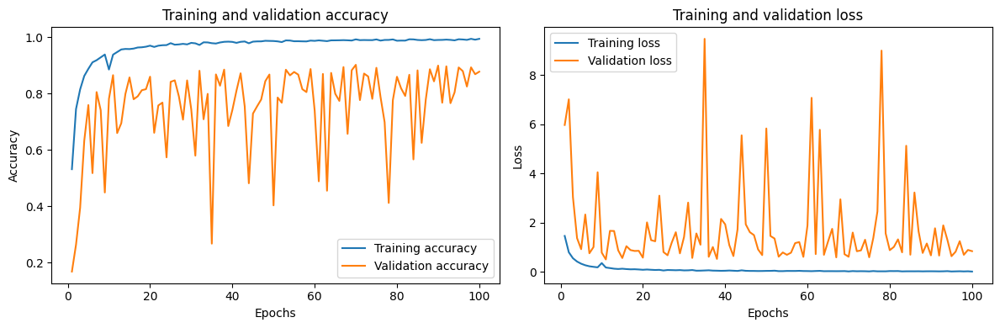

In [103]:
plot_training_curves(best_model_37x37_history)

In [101]:
print(f'Validation accuracy: {best_model_37x37_history.history["val_accuracy"][-1]}')

Validation accuracy: 0.8773333430290222


**From the above the graphs, there can be seen there is overfitting, the model learns pretty well for the training data set but it does not perfrom well on the validation data, but validation accuracy is increased by 0.05.**

### Testing the model on the test data

In [38]:
##producing test accuracy
def evaluate_model_on_test_data(model, test_generator):
    test_loss, test_accuracy = model.evaluate(test_generator)
    print(f"Test Accuracy: {test_accuracy}")


In [193]:
evaluate_model_on_test_data(best_model_37x37,test_generators)

100/100 [==============================] - 3s 26ms/step - loss: 0.9070 - accuracy: 0.8627
Test Accuracy: 0.862666666507721


In [174]:
test_loss, test_acc = best_model_37x37.evaluate(test_generators)
print(f"Test accuracy: {test_acc}, Test loss: {test_loss}")

100/100 [==============================] - 3s 26ms/step - loss: 0.9070 - accuracy: 0.8627
Test accuracy: 0.862666666507721, Test loss: 0.9070020914077759


**The model has also the accuracy 0.878 on the test data.**

100/100 [==============================] - 3s 26ms/step
Classification Report:
              precision    recall  f1-score   support

        Bean       0.85      0.88      0.86       200
Bitter_Gourd       0.78      0.96      0.87       200
Bottle_Gourd       0.91      0.96      0.93       200
     Brinjal       0.75      0.94      0.83       200
    Broccoli       0.89      0.81      0.85       200
     Cabbage       0.91      0.77      0.83       200
    Capsicum       0.87      0.94      0.90       200
      Carrot       0.93      0.86      0.89       200
 Cauliflower       0.92      0.69      0.79       200
    Cucumber       0.92      0.92      0.92       200
      Papaya       0.89      0.85      0.87       200
      Potato       0.87      0.81      0.84       200
     Pumpkin       0.75      0.94      0.84       200
      Radish       0.90      0.89      0.89       200
      Tomato       0.90      0.70      0.79       200

    accuracy                           0.86      3000
 

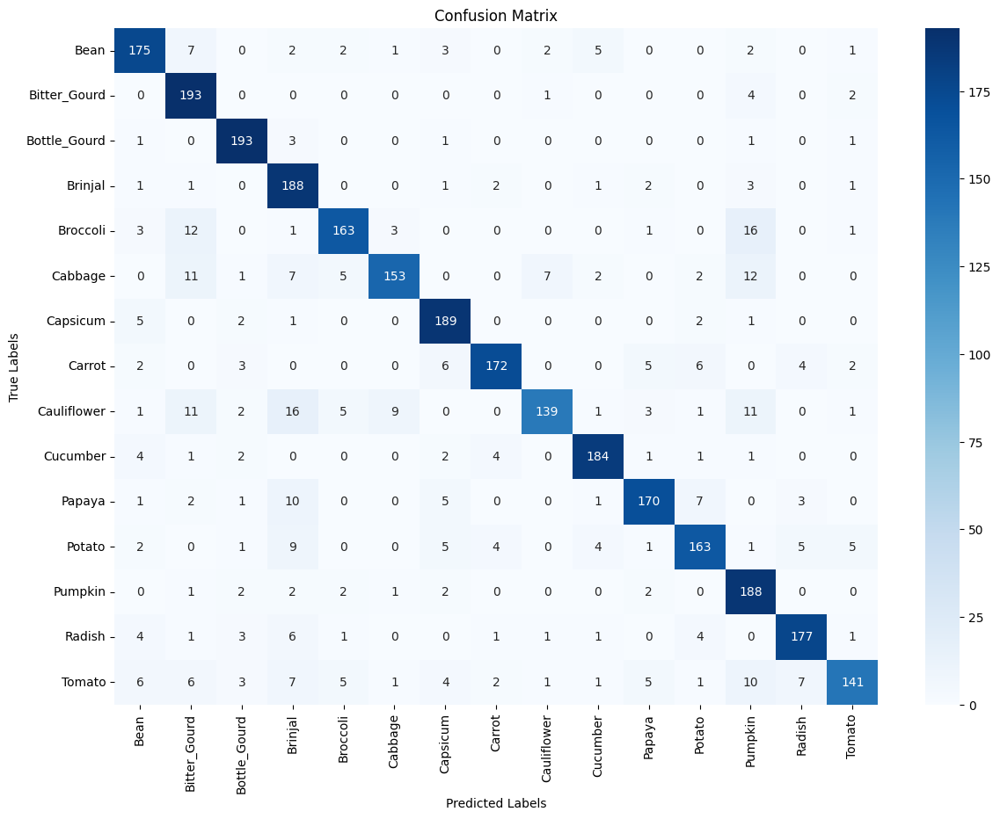

In [205]:
class_names = list(train_generator.class_indices.keys())
# Plot confusion matrix
evaluate_model(best_model_37x37, test_generators, class_names)

**From the confusion matrix,the best model for 37x37 model, broccoli,cabbabe and cauliflower are misclassified as bitter gourd and pumpkin. Cauliflower and Papaya are mostly misclassified as brinjal.  
From the classification report,the model can predict well for bottle gourd, capsicum, carrot, cucumber and radish because they have high F1 score which means a balance between recall and precision**

**Saving the best weights of 37x37 model**

In [111]:
best_model_37x37.save_weights('best_model_weights_37x37_image_classification.h5')

## Training the model with the size of the images 131x131

In [118]:
# Creating generators
train_generator_131x131 = train_datagen.flow_from_directory(
    train_dataset_dir,
    batch_size=30,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(131,131)
)

Found 11784 images belonging to 15 classes.


In [197]:
test_generator_131x131 = test_val_datagen.flow_from_directory(
    test_dataset_dir,
    batch_size=30,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(131,131),
    shuffle=False
    )

Found 3000 images belonging to 15 classes.


In [34]:
validation_generator_131x131 = test_val_datagen.flow_from_directory(
    validation_dataset_dir,
    batch_size=30,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(131,131)
)

Found 3000 images belonging to 15 classes.


In [27]:
### building model for the 131x131 images
def building_model_131X131(activation='relu'):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(131, 131, 1), activation=activation))
    ## adding batch normalization after each activation
    model.add(BatchNormalization())  
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Conv2D(64, (3, 3), activation=activation))
    model.add(BatchNormalization())  
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Flatten())
    model.add(Dropout(0.3))
    model.add(Dense(128, activation=activation))
    model.add(BatchNormalization())  
    model.add(Dense(50, activation=activation))
    model.add(BatchNormalization()) 
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [35]:
### Training the model
model_131x131 = building_model('relu')
model_131x131.compile(optimizer=Adam(learning_rate=0.01), loss='categorical_crossentropy', metrics=['accuracy'])
model_131x131_history = model_131x131.fit(train_generator_131x131,
                            epochs=100,  
                            validation_data=validation_generator_131x131)

Epoch 1/100
393/393 [==============================] - 25s 61ms/step - loss: 1.2391 - accuracy: 0.6124 - val_loss: 6.5542 - val_accuracy: 0.1483
Epoch 2/100
393/393 [==============================] - 15s 38ms/step - loss: 0.4934 - accuracy: 0.8416 - val_loss: 1.0874 - val_accuracy: 0.6997
Epoch 3/100
393/393 [==============================] - 15s 39ms/step - loss: 0.2370 - accuracy: 0.9263 - val_loss: 2.2184 - val_accuracy: 0.5867
Epoch 4/100
393/393 [==============================] - 15s 39ms/step - loss: 0.1705 - accuracy: 0.9437 - val_loss: 2.6910 - val_accuracy: 0.4737
Epoch 5/100
393/393 [==============================] - 15s 38ms/step - loss: 0.1627 - accuracy: 0.9503 - val_loss: 1.0489 - val_accuracy: 0.7563
Epoch 6/100
393/393 [==============================] - 15s 38ms/step - loss: 0.1011 - accuracy: 0.9679 - val_loss: 3.2860 - val_accuracy: 0.5297
Epoch 7/100
393/393 [==============================] - 15s 37ms/step - loss: 0.1383 - accuracy: 0.9577 - val_loss: 5.5540 - val_ac

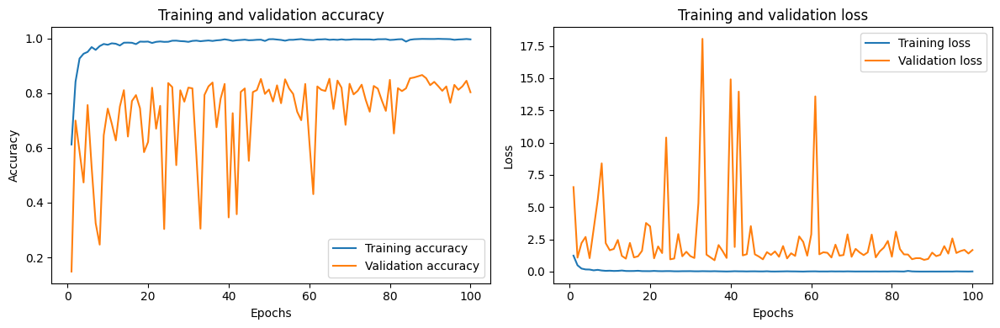

In [37]:
## getting the training curve for 131x131 model
plot_training_curves(model_131x131_history)

**From the Accuracy and Loss curve, the model is quite a good fit for the training model but for the validation data, it has quite a number of fluctuations. which means there is overfitting in this model**

In [108]:
### getting the test accuracy 
evaluate_model_on_test_data(model_131x131,test_generator_131x131)

100/100 [==============================] - 3s 30ms/step - loss: 1.8281 - accuracy: 0.8730
Test Accuracy: 0.8730000257492065


### Model Improvement for 131x131 model

In [103]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from keras.regularizers import l2




In [112]:
### adding more loayers, using GlobalAveragePooling2D and regularization l2
def building_model_131x131_more_layers(activation='relu'):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=(131, 131, 1), activation=activation))
    model.add(BatchNormalization())  
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(Conv2D(64, (3, 3), activation=activation))
    model.add(BatchNormalization())  
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    model.add(Conv2D(128, (3, 3), activation=activation))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(128, (3, 3), activation=activation))
    model.add(BatchNormalization())
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    # Replace Flatten with GlobalAveragePooling2D
    model.add(GlobalAveragePooling2D())
    
    model.add(Dropout(0.4))
    model.add(Dense(128, activation=activation, kernel_regularizer=l2(0.01)))
    model.add(BatchNormalization())
    model.add(Dense(50, activation=activation, kernel_regularizer=l2(0.01)))
    model.add(BatchNormalization())
    
    model.add(Dense(num_classes, activation='softmax'))
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [113]:
### Training the model
model_131x131_new = building_model_131x131_more_layers('relu')
model_131x131_new.compile(optimizer=Adam(learning_rate=0.01), loss='categorical_crossentropy', metrics=['accuracy'])
model_131x131_new_history = model_131x131_new.fit(train_generator_131x131,
                            epochs=100,  
                            validation_data=validation_generator_131x131)

Epoch 1/100
393/393 [==============================] - 17s 40ms/step - loss: 2.3990 - accuracy: 0.4242 - val_loss: 8.3314 - val_accuracy: 0.0910
Epoch 2/100
393/393 [==============================] - 15s 39ms/step - loss: 1.7810 - accuracy: 0.5727 - val_loss: 4.5674 - val_accuracy: 0.2197
Epoch 3/100
393/393 [==============================] - 15s 39ms/step - loss: 1.4515 - accuracy: 0.6681 - val_loss: 6.5088 - val_accuracy: 0.0997
Epoch 4/100
393/393 [==============================] - 15s 38ms/step - loss: 1.1991 - accuracy: 0.7304 - val_loss: 4.3194 - val_accuracy: 0.3027
Epoch 5/100
393/393 [==============================] - 15s 38ms/step - loss: 1.0152 - accuracy: 0.7761 - val_loss: 3.0108 - val_accuracy: 0.4010
Epoch 6/100
393/393 [==============================] - 15s 38ms/step - loss: 0.8716 - accuracy: 0.8068 - val_loss: 2.2233 - val_accuracy: 0.5190
Epoch 7/100
393/393 [==============================] - 15s 39ms/step - loss: 0.7769 - accuracy: 0.8310 - val_loss: 1.1928 - val_ac

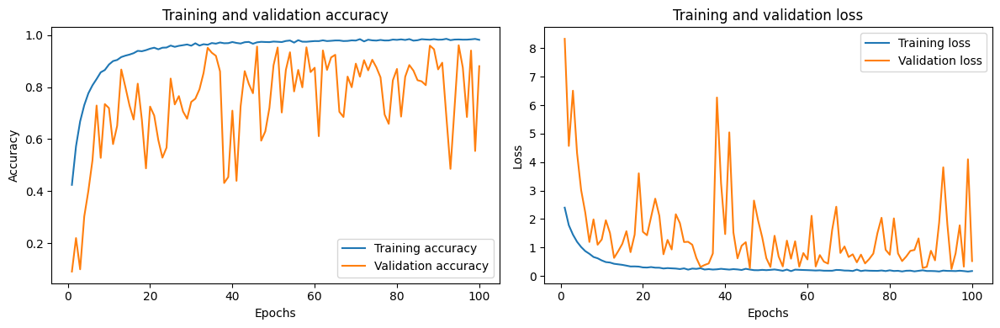

In [114]:
plot_training_curves(model_131x131_new_history)

In [115]:
evaluate_model_on_test_data(model_131x131_new,test_generator_131x131)

100/100 [==============================] - 14s 138ms/step - loss: 0.5619 - accuracy: 0.8833
Test Accuracy: 0.8833333253860474


**Training the model without Data Augmentation**

In [117]:
train_generator_131x131_without_augmentation = train_datagen.flow_from_directory(
    train_dataset_dir_without_augmentation,
    batch_size=30,
    class_mode='categorical',
    color_mode='grayscale',
    target_size=(131,131)
)

Found 9032 images belonging to 15 classes.


**Training the model Again**

In [122]:
### Training the model
model_131x131_without_augmentation = building_model_131x131_more_layers('relu')
model_131x131_without_augmentation.compile(optimizer=Adam(learning_rate=0.01), loss='categorical_crossentropy', metrics=['accuracy'])
model_131x131_without_augmentation_history = model_131x131_without_augmentation.fit(train_generator_131x131_without_augmentation,
                            epochs=100,  
                            validation_data=validation_generator_131x131)

Epoch 1/100
302/302 [==============================] - 43s 139ms/step - loss: 2.4531 - accuracy: 0.4253 - val_loss: 3.3152 - val_accuracy: 0.1097
Epoch 2/100
302/302 [==============================] - 12s 40ms/step - loss: 2.1915 - accuracy: 0.4743 - val_loss: 2.9985 - val_accuracy: 0.2977
Epoch 3/100
302/302 [==============================] - 12s 40ms/step - loss: 1.7425 - accuracy: 0.5791 - val_loss: 13.6218 - val_accuracy: 0.1863
Epoch 4/100
302/302 [==============================] - 12s 40ms/step - loss: 1.6941 - accuracy: 0.6300 - val_loss: 9.7821 - val_accuracy: 0.1200
Epoch 5/100
302/302 [==============================] - 12s 40ms/step - loss: 1.3263 - accuracy: 0.7037 - val_loss: 6.9489 - val_accuracy: 0.1283
Epoch 6/100
302/302 [==============================] - 12s 40ms/step - loss: 1.2351 - accuracy: 0.7383 - val_loss: 4.9382 - val_accuracy: 0.2733
Epoch 7/100
302/302 [==============================] - 12s 40ms/step - loss: 1.1315 - accuracy: 0.7513 - val_loss: 4.9351 - val_

In [127]:
evaluate_model_on_test_data(model_131x131_without_augmentation,test_generator_131x131)

100/100 [==============================] - 3s 31ms/step - loss: 5.9056 - accuracy: 0.4640
Test Accuracy: 0.46399998664855957


**Ploting the training curve for the model without data augmentation**

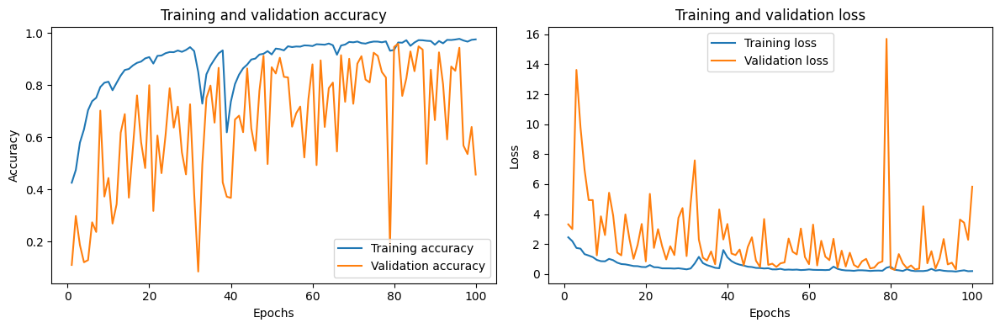

In [126]:
plot_training_curves(model_131x131_without_augmentation_history)

**When the model is trained without data augmentation, the model performance is not quite good,compared to the model trained with data augmentation. However, there may be other reasons that the model is overfitted. For example in the above cases the model is overfitted after a number of epoches.**

In [131]:
### Adding the Early Stopping and Train the model again to prevent overfitting
from keras.callbacks import EarlyStopping


In [137]:
model_131x131_with_early_stopping = building_model_131x131_more_layers('relu')
model_131x131_with_early_stopping.compile(optimizer=Adam(learning_rate=0.01), loss='categorical_crossentropy', metrics=['accuracy'])

# EarlyStopping callback with patience 5 and monitor the validation accuracy
early_stopping = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
model_131x131_new_history = model_131x131_with_early_stopping.fit(train_generator_131x131,
                            epochs=100,  
                            validation_data=validation_generator_131x131,callbacks=[early_stopping])

Epoch 1/100
393/393 [==============================] - 40s 99ms/step - loss: 2.3956 - accuracy: 0.4172 - val_loss: 8.7025 - val_accuracy: 0.0937
Epoch 2/100
393/393 [==============================] - 15s 39ms/step - loss: 1.7702 - accuracy: 0.5629 - val_loss: 3.3196 - val_accuracy: 0.2047
Epoch 3/100
393/393 [==============================] - 15s 38ms/step - loss: 1.4859 - accuracy: 0.6517 - val_loss: 5.9184 - val_accuracy: 0.2220
Epoch 4/100
393/393 [==============================] - 15s 38ms/step - loss: 1.2353 - accuracy: 0.7219 - val_loss: 4.9579 - val_accuracy: 0.2707
Epoch 5/100
393/393 [==============================] - 15s 38ms/step - loss: 1.0597 - accuracy: 0.7640 - val_loss: 8.8116 - val_accuracy: 0.0763
Epoch 6/100
393/393 [==============================] - 15s 39ms/step - loss: 0.8987 - accuracy: 0.8016 - val_loss: 1.7992 - val_accuracy: 0.5703
Epoch 7/100
393/393 [==============================] - 15s 38ms/step - loss: 0.7793 - accuracy: 0.8296 - val_loss: 2.9339 - val_ac

In [139]:
evaluate_model_on_test_data(model_131x131_new,test_generator_131x131)

100/100 [==============================] - 3s 32ms/step - loss: 0.5619 - accuracy: 0.8833
Test Accuracy: 0.8833333253860474
